# **Imports**

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap
import seaborn as sns
import plotly.express as px

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn import tree
from sklearn import ensemble

# **Uploading the data**

In [3]:
college = pd.read_csv("college.csv")
box_scores = pd.read_csv("Basketball-BoxScores.csv")
player_box_scores = pd.read_csv("Basketball-PlayerBoxScore.csv")
team_box_scores = pd.read_csv("Basketball-TeamBoxScores.csv")
standings = pd.read_csv("Standings.csv")

A preview of what is in each table ...

In [4]:
college.head()

,Unnamed: 0,active_from,active_to,birth_date,college,height,name,position,url,weight,...,NCAA__3ptpg,NCAA_efgpct,NCAA_fgapg,NCAA_fgpct,NCAA_fgpg,NCAA_ft,NCAA_ftapg,NCAA_ftpg,NCAA_games,NCAA_ppg
0,0,1991,1995,"June 24, 1968",Duke University,6-10,Alaa Abdelnaby,F-C,/players/a/abdelal01.html,240.0,...,0.0,NaN,5.6,0.599,3.3,0.728,2.5,1.8,134.0,8.5
1,1,1969,1978,"April 7, 1946",Iowa State University,6-9,Zaid Abdul-Aziz,C-F,/players/a/abdulza01.html,235.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1970,1989,"April 16, 1947","University of California, Los Angeles",7-2,Kareem Abdul-Jabbar,C,/players/a/abdulka01.html,225.0,...,NaN,NaN,16.8,0.639,10.7,0.628,7.9,5.0,88.0,26.4
3,3,1991,2001,"March 9, 1969",Louisiana State University,6-1,Mahmoud Abdul-Rauf,G,/players/a/abdulma02.html,162.0,...,2.7,NaN,21.9,0.474,10.4,0.863,6.4,5.5,64.0,29.0
4,4,1998,2003,"November 3, 1974","University of Michigan, San Jose State University",6-6,Tariq Abdul-Wahad,F,/players/a/abdulta01.html,223.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
box_scores.head()

,gmDate,gmTime,seasTyp,offLNm,offFNm,teamAbbr,teamConf,teamDiv,teamLoc,teamRslt,...,opptFIC40,opptOrtg,opptDrtg,opptEDiff,opptPlay%,opptAR,opptAST/TO,opptSTL/TO,poss,pace
0,2012-10-30,19:00,Regular,Brothers,Tony,WAS,East,Southeast,Away,Loss,...,61.6667,105.6882,94.4447,11.2435,0.4390,16.7072,1.0476,33.3333,88.9409,88.9409
1,2012-10-30,19:00,Regular,Smith,Michael,WAS,East,Southeast,Away,Loss,...,61.6667,105.6882,94.4447,11.2435,0.4390,16.7072,1.0476,33.3333,88.9409,88.9409
2,2012-10-30,19:00,Regular,Workman,Haywoode,WAS,East,Southeast,Away,Loss,...,61.6667,105.6882,94.4447,11.2435,0.4390,16.7072,1.0476,33.3333,88.9409,88.9409
3,2012-10-30,19:00,Regular,Brothers,Tony,CLE,East,Central,Home,Win,...,56.0417,94.4447,105.6882,-11.2435,0.3765,18.8679,2.0000,84.6154,88.9409,88.9409
4,2012-10-30,19:00,Regular,Smith,Michael,CLE,East,Central,Home,Win,...,56.0417,94.4447,105.6882,-11.2435,0.3765,18.8679,2.0000,84.6154,88.9409,88.9409


In [6]:
player_box_scores.head()

,gmDate,gmTime,seasTyp,playLNm,playFNm,teamAbbr,teamConf,teamDiv,teamLoc,teamRslt,...,playFT%,playORB,playDRB,playTRB,opptAbbr,opptConf,opptDiv,opptLoc,opptRslt,opptDayOff
0,2012-10-30,19:00,Regular,Price,A.J.,WAS,East,Southeast,Away,Loss,...,1.0,1,1,2,CLE,East,Central,Home,Win,0
1,2012-10-30,19:00,Regular,Ariza,Trevor,WAS,East,Southeast,Away,Loss,...,0.5,1,2,3,CLE,East,Central,Home,Win,0
2,2012-10-30,19:00,Regular,Okafor,Emeka,WAS,East,Southeast,Away,Loss,...,0.5,5,2,7,CLE,East,Central,Home,Win,0
3,2012-10-30,19:00,Regular,Beal,Bradley,WAS,East,Southeast,Away,Loss,...,1.0,0,3,3,CLE,East,Central,Home,Win,0
4,2012-10-30,19:00,Regular,Booker,Trevor,WAS,East,Southeast,Away,Loss,...,0.0,1,0,1,CLE,East,Central,Home,Win,0


In [7]:
team_box_scores.head()

,gmDate,gmTime,seasTyp,offLNm1,offFNm1,offLNm2,offFNm2,offLNm3,offFNm3,teamAbbr,...,opptFIC40,opptOrtg,opptDrtg,opptEDiff,opptPlay%,opptAR,opptAST/TO,opptSTL/TO,poss,pace
0,2012-10-30,19:00,Regular,Brothers,Tony,Smith,Michael,Workman,Haywoode,WAS,...,61.6667,105.6882,94.4447,11.2435,0.4390,16.7072,1.0476,33.3333,88.9409,88.9409
1,2012-10-30,19:00,Regular,Brothers,Tony,Smith,Michael,Workman,Haywoode,CLE,...,56.0417,94.4447,105.6882,-11.2435,0.3765,18.8679,2.0000,84.6154,88.9409,88.9409
2,2012-10-30,20:00,Regular,McCutchen,Monty,Wright,Sean,Fitzgerald,Kane,BOS,...,80.8333,126.3381,112.6515,13.6866,0.5244,19.8287,3.1250,100.0000,94.9832,94.9832
3,2012-10-30,20:00,Regular,McCutchen,Monty,Wright,Sean,Fitzgerald,Kane,MIA,...,62.7083,112.6515,126.3381,-13.6866,0.4643,18.8501,1.5000,25.0000,94.9832,94.9832
4,2012-10-30,22:30,Regular,Foster,Scott,Zielinski,Gary,Dalen,Eric,DAL,...,58.6458,99.3678,108.1034,-8.7356,0.5000,18.6567,1.7143,42.8571,91.5790,91.5790


In [8]:
standings.head()

,stDate,teamAbbr,rank,rankOrd,gameWon,gameLost,stk,stkType,stkTot,gameBack,...,rel%Indx,mov,srs,pw%,pyth%13.91,wpyth13.91,lpyth13.91,pyth%16.5,wpyth16.5,lpyth16.5
0,2012-10-30,ATL,3,3rd,0,0,-,-,0,0.5,...,0.0,0.0,0.0,0.500,0.0000,0.0000,82.0000,0.000,0.000,82.000
1,2012-10-30,BKN,3,3rd,0,0,-,-,0,0.5,...,0.0,0.0,0.0,0.500,0.0000,0.0000,82.0000,0.000,0.000,82.000
2,2012-10-30,BOS,14,14th,0,1,L1,loss,1,1.0,...,0.0,-13.0,-13.0,0.072,0.1687,13.8334,68.1666,0.131,10.742,71.258
3,2012-10-30,CHA,3,3rd,0,0,-,-,0,0.5,...,0.0,0.0,0.0,0.500,0.0000,0.0000,82.0000,0.000,0.000,82.000
4,2012-10-30,CHI,3,3rd,0,0,-,-,0,0.5,...,0.0,0.0,0.0,0.500,0.0000,0.0000,82.0000,0.000,0.000,82.000


# **Data Cleaning**

The first step in data cleaning is to address any null values in the dataset. We decided to set any null values in the player's statistics to be 0. We did this because when we create our models later in the notebook, we sum up all of the statistics. Thus, setting any null values to 0 won't affect a player's sum statistic.

In [9]:
player_box_scores.fillna(0, inplace=True)

Next, we checked if there were any irregularities in the player's data, specifically if their height or weight ever changed between seasons. We found that one player's (Elfrid Payton's) weight and height reduced significantly over the course of a couple of months. To address this difference, we decided to use the lower of his height and weight.

In [10]:
#check if players' height/weight ever change
height = player_box_scores.groupby('playDispNm')['playHeight'].nunique() != 1
mismatch_height = np.where(height)[0]
mismatch_height_players = [height.index[i] for i in mismatch_height]
mismatch_height_players
chrisjohnson = player_box_scores[player_box_scores['playDispNm'] == 'Chris Johnson'][['teamAbbr', 'gmDate','playDispNm','playHeight','playWeight']]
#print(chrisjohnson.drop_duplicates(['playDispNm','playHeight','playWeight']))
chriswright = player_box_scores[player_box_scores['playDispNm'] == 'Chris Wright'][['teamAbbr', 'gmDate','playDispNm','playHeight','playWeight']]
#print(chriswright.drop_duplicates(['playDispNm','playHeight','playWeight']))
elfridpayton = player_box_scores[player_box_scores['playDispNm'] == 'Elfrid Payton'][['teamAbbr', 'gmDate','playDispNm','playHeight','playWeight']]
#print(elfridpayton.drop_duplicates(['playDispNm','playHeight','playWeight']))
mikejames = player_box_scores[player_box_scores['playDispNm'] == 'Mike James'][['teamAbbr', 'gmDate','playDispNm','playHeight','playWeight']]
#print(mikejames.drop_duplicates(['playDispNm','playHeight','playWeight']))
tonymitchell = player_box_scores[player_box_scores['playDispNm'] == 'Tony Mitchell'][['teamAbbr', 'gmDate','playDispNm','playHeight','playWeight']]
#print(tonymitchell.drop_duplicates(['playDispNm','playHeight','playWeight']))

#seems like there's only one and his height/weight changed, so we are going to go ahead and just set all of his heights to 76 and weight to 185
player_box_scores.loc[player_box_scores.playDispNm == 'Elfrid Payton', ['playHeight','playWeight']] = 76, 185
player_box_scores[player_box_scores['playDispNm']=='Elfrid Payton'][['playDispNm','playHeight','playWeight']]

,playDispNm,playHeight,playWeight
51390,Elfrid Payton,76,185
51726,Elfrid Payton,76,185
51998,Elfrid Payton,76,185
52505,Elfrid Payton,76,185
52609,Elfrid Payton,76,185
...,...,...,...
151766,Elfrid Payton,76,185
152163,Elfrid Payton,76,185
152532,Elfrid Payton,76,185
152737,Elfrid Payton,76,185


Now we will create some cleaned dataframes so that we can conduct analysis on the dataset. The resulting dataframe has all of the relevant quantitative columns along with the win/loss statistic. We also normalize our data.

In [11]:
#setting the index to the player names, height, weight as these are common
player_box_scores_cleaned = player_box_scores.set_index(['playDispNm', 'playHeight', 'playWeight'])

#removing non-quantitative columns and useless quantitative columns... dividing number of points/assists/to by number of minutes played
player_box_scores_filtered = player_box_scores_cleaned[['playPTS', 'playAST', 'playTO',
       'playSTL', 'playBLK', 'playPF', 'playFGA', 'playFGM', 'play2PA',
       'play2PM', 'play3PA', 'play3PM', 'playFTA', 'playFTM', 'playORB',
       'playDRB', 'playMin']]
player_box_scores_cleaned = player_box_scores_filtered

#group by name, weight, height per player and taking the mean for all games the player played for each stat
player_box_scores_win = player_box_scores.loc[:,'teamRslt']

#keeping the weight/height of each player as columns
player_box_scores_cleaned = player_box_scores_cleaned.reset_index(level=[1,2])
player_box_scores_centered_scaled = (player_box_scores_cleaned - np.mean(player_box_scores_cleaned))/np.std(player_box_scores_cleaned)

#replacing win/loss w 1/0
player_box_scores_centered_scaled['WinLoss'] = player_box_scores_win.values
player_box_scores_centered_scaled = player_box_scores_centered_scaled.replace('Win',1)
player_box_scores_centered_scaled = player_box_scores_centered_scaled.replace('Loss',0)
player_box_scores_centered_scaled

,playHeight,playWeight,playPTS,playAST,playTO,playSTL,playBLK,playPF,playFGA,playFGM,play2PA,play2PM,play3PA,play3PM,playFTA,playFTM,playORB,playDRB,playMin,WinLoss
playDispNm,,,,,,,,,,,,,,,,,,,,
A.J. Price,-1.460477,-0.884370,-0.342607,1.567200,-0.219102,-0.748016,-0.539087,-0.623687,0.910364,-0.546944,-0.372274,-1.077988,2.648342,0.964352,-0.420860,-0.284613,0.000507,-0.775433,0.568992,0
Trevor Ariza,0.289169,-0.691690,-0.088358,0.758966,-0.938005,2.306473,1.800196,-1.310725,0.005287,-0.209629,-0.372274,-0.694265,0.679484,0.964352,-0.058194,-0.284613,0.000507,-0.404721,0.194393,0
Emeka Okafor,0.872385,1.427788,0.038767,-0.857503,-0.219102,-0.748016,4.139479,-0.623687,0.367318,0.127686,0.944445,0.456906,-0.895603,-0.659382,0.667138,0.160132,2.873402,-0.404721,0.194393,0
Bradley Beal,-0.585654,-0.614618,-0.215482,0.354848,0.499802,0.270147,-0.539087,-0.623687,0.005287,-0.546944,-0.372274,-1.077988,0.679484,0.964352,-0.058194,0.160132,-0.717716,-0.034009,-0.086557,0
Trevor Booker,-0.002438,0.849749,-0.723981,-0.453386,1.937608,0.270147,0.630555,1.437425,0.186302,-0.546944,0.505539,-0.310541,-0.501831,-0.659382,-0.783526,-0.729357,0.000507,-1.146145,-0.554806,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
JaKarr Sampson,0.580777,-0.152187,0.165892,-0.857503,-0.938005,-0.748016,0.630555,-0.623687,0.005287,0.465001,0.505539,0.840629,-0.895603,-0.659382,-0.420860,-0.284613,-0.717716,0.336703,0.007093,1
Buddy Hield,-0.585654,-0.229258,0.547265,1.163083,-0.938005,1.288310,-0.539087,0.063350,0.910364,0.802316,0.724992,0.456906,0.679484,0.964352,-0.420860,-0.729357,0.718731,-0.034009,0.475342,1
Nigel Hayes,0.289169,1.389252,-0.723981,-0.857503,-0.938005,0.270147,0.630555,0.063350,-0.537759,-0.546944,-0.591727,-0.310541,-0.108059,-0.659382,-0.783526,-0.729357,0.000507,-0.034009,0.381692,1


# **PCA**

We conduct PCA in an effort to reduce dimensionality. Since there are so many player statistics in the dataset, PCA will help to understand player archetypes through top principal components that capture the most variance. Using singular value decompostion and PCA, we create a dataframe with just the top two principal components for each player's game.


In [12]:
u, s, vt = np.linalg.svd(player_box_scores_centered_scaled, full_matrices=False)
player_box_scores_2_pcs = pd.DataFrame(player_box_scores_centered_scaled @ vt.T)[[0,1]]
player_box_scores_2_pcs = player_box_scores_2_pcs.rename({0:'pc1', 1:'pc2'}, axis=1)
first_2_pcs = player_box_scores_2_pcs
first_2_pcs

,pc1,pc2
playDispNm,,
A.J. Price,-0.095657,-3.248188
Trevor Ariza,-0.031852,-0.960230
Emeka Okafor,-0.817659,3.911378
Bradley Beal,0.431044,-1.860065
Trevor Booker,0.710775,0.795003
...,...,...
JaKarr Sampson,0.320969,1.077751
Buddy Hield,-1.577245,-1.108028
Nigel Hayes,1.543374,1.255085


Now, we will create a scree plot to see how much variance is captured by each principal component.

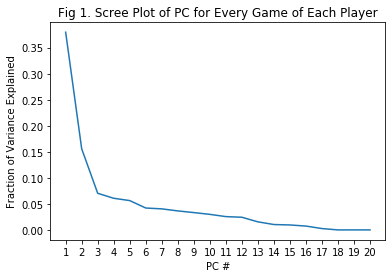

In [13]:
plt.plot(np.arange(1,21), s**2 / sum(s**2));
plt.xticks(np.arange(1,21), np.arange(1,21));
plt.xlabel('PC #');
plt.ylabel('Fraction of Variance Explained');
plt.title('Fig 1. Scree Plot of PC for Every Game of Each Player');

From the Scree Plot (Figure 1), we can see that the first principal component explains about 35% of the variance and the second principal component explains about 15%. 

In order to better understand what PC1 and PC2 are, we will create a scatterplot of PC1 against PC2 to see if we can make any sense out of the components.

In [14]:
first_2_pcs_jittered = first_2_pcs.loc[:, :] + np.random.normal(0, 0.1, size = (len(first_2_pcs), 2))

fig = px.scatter(first_2_pcs_jittered, x='pc1', y='pc2', color = player_box_scores_win, text=first_2_pcs.index)
fig.update_layout(
    title="Fig 2. PC1 vs PC2 for Every Game of Each Player",
    title_x=0.5,
    xaxis_title="PC 1",
    yaxis_title="PC 2"
)
fig.update_traces(textposition='top center')
fig.show()

When we plot PC1 against PC2 with jitter in Figure 2, we have way too many data points for us to deduce much from the visualization. However, games of players with low PC1 are all players that we recognize, such as Russell Westbrook, Kobe Bryant, and Anthony Davis, since they are star players of their teams. One outlier in the graph is Devin Booker on the far left, which we will look into a little more later. We tried to color code each point by the game result to visualize the correspondence to winning; however, it doesn’t seem to share any information.


In Figure 2, we have an outlier of Devin Booker. From further exploration and research, this must be due to his outstanding game against the Celtics on March 24, 2017 where he scored 70 points (Figure 6). 

In [15]:
devin = player_box_scores[player_box_scores['playDispNm']=='Devin Booker']
devin_game = devin[devin['gmDate']=='2017-03-24']
devin_game = devin_game[['gmDate','playDispNm','teamAbbr','playPTS', 'playAST', 'playTO',
       'playSTL', 'playFGA', 'playFGM', 'play2PA',
       'play3PA', 'playFTA', 'playORB',
       'playDRB', 'playMin']]
devin_game= devin_game.rename_axis('Fig 6. Devin Booker Game', axis=1)
devin_game

Fig 6. Devin Booker Game,gmDate,playDispNm,teamAbbr,playPTS,playAST,playTO,playSTL,playFGA,playFGM,play2PA,play3PA,playFTA,playORB,playDRB,playMin
126352,2017-03-24,Devin Booker,PHO,70,6,5,3,40,21,29,11,26,2,6,45


In Figure 1, we struggled to make sense of our scatterplot because there were way too many datapoints. Now we will use the same dataframe as before, but group by players and sum over their player statistics to reduce the number of datapoints and gain a more holistic understanding of each player. We will also filter out any players who scored less than 10 points or played less than 96 minutes (2 full games of playtime), because these could skew our data. Once again, we normalize our data.

In [16]:
#setting the index to the player names, height, weight as these are unique identifiers
player_box_scores_cleaned = player_box_scores.set_index(['playDispNm', 'playHeight', 'playWeight', 'playPos'])

player_box_scores_model = player_box_scores.set_index(['playDispNm'])

#removing non-quantitative columns and useless quantitative columns... dividing number of points/assists/to by number of minutes played
player_box_scores_filtered = player_box_scores_cleaned[['playPTS', 'playAST', 'playTO',
       'playSTL', 'playBLK', 'playPF', 'playFGA', 'playFGM', 'play2PA',
       'play2PM', 'play3PA', 'play3PM', 'playFTA', 'playFTM', 'playORB',
       'playDRB', 'playMin','playStat']]
player_box_scores_cleaned = player_box_scores_filtered

#group by name, weight, height per player and taking the mean for all games the player played for each stat
player_box_scores_cleaned = player_box_scores_cleaned.groupby(['playDispNm','playWeight','playHeight', 'playPos']).agg(np.sum)

#data cleaning, removing players that scored less than 10 points (career-wide) and played less than two full games
player_box_scores_cleaned = player_box_scores_cleaned[player_box_scores_cleaned['playPTS'] >= 10]
player_box_scores_cleaned = player_box_scores_cleaned[player_box_scores_cleaned['playMin'] >= 96]

#keeping the weight/height of each player as columns
player_box_scores_cleaned = player_box_scores_cleaned.reset_index(level=[1,2])
sum_of_min_played = player_box_scores_cleaned['playMin']
player_box_scores_cleaned = player_box_scores_cleaned.drop('playMin',axis=1)
player_box_scores_centered_scaled = (player_box_scores_cleaned - np.mean(player_box_scores_cleaned))/np.std(player_box_scores_cleaned)
player_box_scores_centered_scaled

,,playWeight,playHeight,playPTS,playAST,playTO,playSTL,playBLK,playPF,playFGA,playFGM,play2PA,play2PM,play3PA,play3PM,playFTA,playFTM,playORB,playDRB
playDispNm,playPos,,,,,,,,,,,,,,,,,,
A.J. Hammons,C,1.279815,1.506996,-0.752656,-0.620941,-0.751532,-0.810568,-0.509837,-0.938939,-0.782629,-0.770206,-0.739568,-0.731670,-0.645840,-0.603378,-0.630984,-0.621543,-0.641792,-0.766473
A.J. Price,PG,-0.952804,-1.605146,-0.453285,-0.116829,-0.452554,-0.517867,-0.599068,-0.694723,-0.415739,-0.463174,-0.488908,-0.508121,-0.134714,-0.166053,-0.492088,-0.476952,-0.557120,-0.594594
Aaron Brooks,PG,-2.332970,-2.227574,0.731025,1.187246,1.197807,0.623666,-0.117223,1.363671,0.895443,0.728916,0.573074,0.417758,1.331411,1.364585,0.218733,0.276988,-0.080285,-0.054652
Aaron Gordon,PF,0.264988,0.573353,0.801124,0.233520,0.400531,0.623666,0.828620,0.784530,0.866706,0.837026,0.751105,0.806769,0.862558,0.622150,0.749806,0.610065,1.105118,1.138082
Aaron Gray,C,2.091677,1.506996,-0.680976,-0.521676,-0.524308,-0.693487,-0.509837,-0.492372,-0.709786,-0.686601,-0.635052,-0.620776,-0.663134,-0.628804,-0.541110,-0.556994,-0.276367,-0.549454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zach LaVine,PG,-1.561701,-0.671503,0.918132,0.811595,1.106121,0.557809,-0.259992,0.767086,0.994349,0.907658,0.813991,0.724038,1.093141,1.110327,0.608867,0.682360,-0.307561,0.250910
Zach Randolph,PF,1.401595,0.573353,2.705402,1.029589,2.441557,1.428594,0.284314,2.357980,3.056018,3.111656,4.064595,3.860763,-0.030951,-0.176223,2.291960,2.195405,4.933166,3.803070
Zaza Pachulia,C,0.873885,1.195782,0.679373,0.852469,1.504758,1.494452,0.427083,2.089342,0.628796,0.694321,1.129308,1.065522,-0.641997,-0.628804,1.141983,1.160028,3.542769,2.072130


This time, using singular value decompostion and PCA, we create a dataframe with just the top two principal components for each player.

In [17]:
u, s, vt = np.linalg.svd(player_box_scores_centered_scaled, full_matrices=False)
player_box_scores_2_pcs = pd.DataFrame(player_box_scores_centered_scaled @ vt.T)[[0,1]]
player_box_scores_2_pcs = player_box_scores_2_pcs.rename({0:'pc1', 1:'pc2'}, axis=1)
player_box_scores_2_pcs = player_box_scores_2_pcs.reset_index(level=1)
first_2_pcs = player_box_scores_2_pcs

position = player_box_scores_2_pcs['playPos']
player_box_scores_2_pcs.drop(columns='playPos', inplace=True)

first_2_pcs

,pc1,pc2
playDispNm,,
A.J. Hammons,-2.870296,1.285694
A.J. Price,-1.759964,-1.666477
Aaron Brooks,2.718470,-3.325724
Aaron Gordon,2.954848,0.859422
Aaron Gray,-2.366387,1.863904
...,...,...
Zach LaVine,2.800918,-2.058292
Zach Randolph,9.585630,3.647481
Zaza Pachulia,4.293071,3.060096


Now, we will create a scree plot to see how much variance is captured by each principal component.

Text(0.5, 1.0, 'Fig 3. Scree Plot of PC for Each Player')

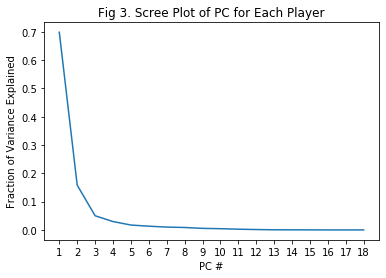

In [18]:
plt.plot(np.arange(1,19), s**2 / sum(s**2));
plt.xticks(np.arange(1,19), np.arange(1,19));
plt.xlabel('PC #');
plt.ylabel('Fraction of Variance Explained');
plt.title('Fig 3. Scree Plot of PC for Each Player')

In the scree plot of Figure 3, the first principal component explains about 70% of the variance and the second principal component explains about 15% of the variance. 

In order to better understand what PC1 and PC2 are, we will create a scatterplot of PC1 against PC2 to see if we can make any sense out of the components.

In [19]:
first_2_pcs_jittered = first_2_pcs.loc[:, :] + np.random.normal(0, 0.1, size = (len(first_2_pcs), 2))

fig = px.scatter(first_2_pcs_jittered, x='pc1', y='pc2', color=position, text=first_2_pcs.index)
fig.update_traces(textposition='top center')
fig.update_layout(
    title="Fig 4. PC1 vs PC2 for Each Player",
    title_x=0.5,
    xaxis_title="PC 1",
    yaxis_title="PC 2"
)
fig.show()

When we plot PC1 against PC2 with jitter in Figure 4, we have a much more digestible visualization. By color coding each point by the player’s position instead of win/loss, we see that players with high PC1 values are renowned star players who start and play long minutes in games. Players with low PC2 values are point guards or shooting guards, and players with high PC2 values are centers or power forwards. 


To confirm our inferences from the scatterplot, we will take a closer look at specific players: Andre Drummond (center), Carmelo Anthony (power forward), Kyrie Irving (point guard, shooting forward), and Shavlik Randolph (power forward).

In [20]:
andre = player_box_scores_cleaned.reset_index()
andre = andre[andre['playDispNm'] == 'Andre Drummond']
andre = pd.merge(andre,first_2_pcs[first_2_pcs.index == 'Andre Drummond'].reset_index(),how='left',on='playDispNm')

melo = player_box_scores_cleaned.reset_index()
melo = melo[melo['playDispNm'] == 'Carmelo Anthony']
melo = pd.merge(melo,first_2_pcs[first_2_pcs.index == 'Carmelo Anthony'].reset_index(),how='left',on='playDispNm').loc[[0,3]]

kyrie = player_box_scores_cleaned.reset_index()
kyrie = kyrie[kyrie['playDispNm'] == 'Kyrie Irving']
kyrie = pd.merge(kyrie,first_2_pcs[first_2_pcs.index == 'Kyrie Irving'].reset_index(),how='left',on='playDispNm')

shavlik = player_box_scores_cleaned.reset_index()
shavlik = shavlik[shavlik['playDispNm'] == 'Shavlik Randolph']
shavlik = pd.merge(shavlik,first_2_pcs[first_2_pcs.index == 'Shavlik Randolph'].reset_index(),how='left',on='playDispNm')

players = andre.append(melo).append(kyrie).append(shavlik)
players = players.drop(['playWeight','playHeight','playFGM','playPF','play3PM','play2PM','playFTM'], axis = 1)
players = players.rename_axis('Fig 7. PC Players', axis=1)
players

Fig 7. PC Players,playDispNm,playPos,playPTS,playAST,playTO,playSTL,playBLK,playFGA,play2PA,play3PA,playFTA,playORB,playDRB,pc1,pc2
0,Andre Drummond,C,6287,513,795,590,708,4922,4892,30,2188,2189,4007,12.493047,8.593446
0,Carmelo Anthony,PF,1109,92,87,40,42,1049,624,425,167,67,356,-1.027777,0.119985
3,Carmelo Anthony,SF,8360,1047,801,317,174,6740,4957,1783,2080,509,1852,10.989638,-0.086654
0,Kyrie Irving,PG,8735,2143,1006,513,123,6910,4804,2106,1767,269,1054,11.549991,-3.532042
0,Shavlik Randolph,PF,111,9,18,16,11,97,92,5,50,51,82,-2.640559,0.884852


In Figure 7, we can see that Andre Drummond, Carmelo Anthony, and Kyrie Irving all have PC1 values of 10 or more with the exception of Carmelo Anthony's PC1 as a shooting forward. On the other hand, we have players like Shavlik Randolph who have a small and negative PC1 value which reflects on his minimal contributions to his team. Hence, players with low PC1 values are benchwarmers who don’t have as much contribution to their teams. We also see that Kyrie Irving, a point guard, has a small, negative PC2 value; Carmelo Anthony, a power forward, has a PC2 value, close to 0; and Andre Drummond, a center, has a large, positive PC2 value. Thus, PC1 seems to represent how much the player contributes to the team and PC2 represents a player’s position/archetype. Something interesting we see with Carmelo Anthony since he plays both the power forward and shooting forward position is that he has a much lower PC1 value as a power forward which means that as a power forward, he makes less contributions. This makes sense because he generally plays as a shooting forward which is where most of his player statistics come from.

Next, we will group each player's PC1 by their team, so that we can see if and how PC1 correlates with a team's win rate. 

In [21]:
first_2_pcs
#player minutes played * pc1 for each member in the same team/total minutes played in that team
team_minutes = player_box_scores.groupby('teamAbbr').agg(np.sum)['playMin']
player_minutes = player_box_scores.groupby(['teamAbbr','playDispNm']).agg(np.sum)[['playMin']]
player_minutes = player_minutes.reset_index(level=1)
merged = player_minutes.merge(first_2_pcs, right_index = True, left_on = 'playDispNm')
merged['weightedPC1'] = merged['playMin']*merged['pc1']
team_weights = merged.groupby(['teamAbbr']).agg(np.sum)[['weightedPC1']]
team_weights['minutes'] = team_minutes
team_weights['team_pc1'] = team_weights['weightedPC1']/team_weights['minutes']

win_team_box_scores = team_box_scores.replace('Win',1)
win_team_box_scores = win_team_box_scores.replace('Loss',0)
team_win = win_team_box_scores.groupby('teamAbbr').agg(np.mean)
win_rate = team_win['teamRslt']

team_weights['win_rate'] = win_rate

We weight each player's PC1 by how many minutes they play throughout the season and for each team, we will divide by total minutes played by the team in order to normalize across all teams. We found this method of weighing PCs for each team in an anlaysis conducted by Scott Bruce from Temple University. We also calculate the win rate for each team so we can use this for our following visualization.

Now we will plot each team's aggregated PC1 by their win rate.

In [22]:
fig = px.scatter(team_weights, x='team_pc1', y='win_rate', text=team_weights.index)
fig.update_traces(textposition='top center')
fig.update_layout(
    title="Fig 5. Win Rate vs PC1 for Each Team",
    title_x=0.5,
    xaxis_title="PC 1",
    yaxis_title="Win Rate",
)
fig.show()

From Figure 5, we see that the teams with a larger positive team PC score also tend to be the teams that have a higher win rate. We can see a likely positive linear relationship between the win rate and a team’s PC1 score. However, there are outliers to this relationship for teams with PC scores between 2.5 and 3.5. One notable outlier is San Antonio Spurs, who won the championship in 2014, have a very high win rate but an average PC score. This could be down to the fact that the Spurs won games as a team rather than individual players scoring the majority of the points. This is also highlighted through Tony Parker, who led San Antonio in scoring in 2014, had the fewest points-per-game of any leading scorer on a championship team. 


# **Feature Engineering**

Next, we want to create a cleaned dataframe with a row for each player to later create our model to predict a player's position.

In [23]:
aggregate_functions = {'playMin':'sum', 'playPTS':'sum', 'playAST':'sum', 'playTO':'sum', 'playSTL':'sum', \
                       'playBLK':'sum', 'playPF':'sum', 'playFGA':'sum', 'playFGM':'sum', 'playFG%':'mean', \
                       'play2PA':'sum', 'play2PM':'sum', 'play2P%':'mean', 'play3PA':'sum', 'play3PM':'sum', \
                       'play3P%':'mean', 'playFTA':'sum', 'playFTM':'sum', 'playFT%':'mean', 'playORB':'sum', \
                       'playDRB':'sum', 'playTRB':'sum'}

We create a dataframe grouped by name, weigiht, height, position and team. This is because there are some players who played for different teams, played different positions, or have the same name. 

In [24]:
player_stats = player_box_scores_model

#group by name, weight, height, team, position per player
player_stats = player_stats.groupby(['playDispNm','playWeight','playHeight', 'playPos', 'teamAbbr']).agg(aggregate_functions)

#data cleaning, removing players that scored less than 10 points and played less than two full games (on one team)
player_stats = player_stats[player_stats['playPTS'] >= 10]
player_stats = player_stats[player_stats['playMin'] >= 96]

#data cleaning, removiing players that have any percentages greater than 1
player_stats = player_stats[player_stats['play2P%'] <= 1]
player_stats = player_stats[player_stats['play3P%'] <= 1]
player_stats = player_stats[player_stats['playFT%'] <= 1]
player_stats = player_stats[player_stats['playFG%'] <= 1]

player_stats = player_stats.div(player_stats['playMin'], axis=0)

player_stats = player_stats.reset_index(level=[1,2,3,4])

In [25]:
player_stats = player_stats[['playPos','playMin','playPTS','playAST','playTO','playSTL','playBLK','playFGA', 'playFGM', 'play2PA', 'play2PM', 'play3PA', 'play3PM', 'playFTA','playFTM', 'playORB', 'playDRB', 'playTRB', 'teamAbbr', 'playHeight','playWeight','play2P%','play3P%','playFG%']]
player_stats.columns = ['Position','Minutes','PTS','AST','TO','STL','BLK','FGA','FGM','2PA','2PM','3PA','3PM','FTA', 'FTM', 'ORB','DRB','REB','Team', 'Height', 'Weight','2P%','3P%','FG%']
player_stats

,Position,Minutes,PTS,AST,TO,STL,BLK,FGA,FGM,2PA,...,FTM,ORB,DRB,REB,Team,Height,Weight,2P%,3P%,FG%
playDispNm,,,,,,,,,,,,,,,,,,,,,
A.J. Hammons,C,1.0,0.300000,0.025000,0.062500,0.006250,0.081250,0.262500,0.106250,0.200000,...,0.056250,0.050000,0.181250,0.231250,DAL,84,250,0.001349,0.001089,0.001648
A.J. Price,PG,1.0,0.544041,0.139896,0.051813,0.020725,0.000000,0.461140,0.202073,0.259067,...,0.062176,0.010363,0.062176,0.072539,IND,74,195,0.002175,0.001900,0.002202
A.J. Price,PG,1.0,0.435644,0.128713,0.069307,0.009901,0.000000,0.455446,0.188119,0.237624,...,0.000000,0.009901,0.089109,0.099010,MIN,74,195,0.002799,0.001355,0.002711
A.J. Price,PG,1.0,0.345611,0.160658,0.050157,0.025862,0.002351,0.323668,0.126176,0.166928,...,0.038401,0.015674,0.073668,0.089342,WAS,74,195,0.000296,0.000235,0.000291
Aaron Brooks,PG,1.0,0.482310,0.147196,0.079773,0.028037,0.008344,0.429573,0.177570,0.263351,...,0.064753,0.017690,0.071429,0.089119,CHI,72,161,0.000139,0.000110,0.000132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zaza Pachulia,C,1.0,0.324190,0.063840,0.059352,0.031920,0.010973,0.234414,0.109227,0.232918,...,0.105736,0.124190,0.233915,0.358105,DAL,83,240,0.000225,0.000000,0.000221
Zaza Pachulia,C,1.0,0.357175,0.107734,0.072865,0.042915,0.022351,0.254359,0.139920,0.253464,...,0.077336,0.102369,0.222173,0.324542,GS,83,240,0.000243,0.000000,0.000242
Zaza Pachulia,C,1.0,0.332241,0.102883,0.073722,0.040957,0.011468,0.287680,0.127457,0.286370,...,0.077326,0.110747,0.162189,0.272936,MIL,83,240,0.000145,0.000000,0.000144


We add an 'Efficiency' column which is calculated from a simplified version of the NBA's formula for efficiency (EFF).

In [26]:
player_stats['Efficiency'] = (player_stats['PTS']+player_stats['REB']+player_stats['AST']+player_stats['STL']+player_stats['BLK']+player_stats['FGM']+player_stats['FTM'])
player_stats_selected = player_stats.drop(columns=['REB','STL','FGA','FGM','2PA','2PM','FTM','FTA','3PA'])

In [27]:
player_stats_selected.head()

,Position,Minutes,PTS,AST,TO,BLK,3PM,ORB,DRB,Team,Height,Weight,2P%,3P%,FG%,Efficiency
playDispNm,,,,,,,,,,,,,,,,
A.J. Hammons,C,1.0,0.300000,0.025000,0.062500,0.081250,0.031250,0.050000,0.181250,DAL,84,250,0.001349,0.001089,0.001648,0.806250
A.J. Price,PG,1.0,0.544041,0.139896,0.051813,0.000000,0.077720,0.010363,0.062176,IND,74,195,0.002175,0.001900,0.002202,1.041451
A.J. Price,PG,1.0,0.435644,0.128713,0.069307,0.000000,0.059406,0.009901,0.089109,MIN,74,195,0.002799,0.001355,0.002711,0.861386
A.J. Price,PG,1.0,0.345611,0.160658,0.050157,0.002351,0.054859,0.015674,0.073668,WAS,74,195,0.000296,0.000235,0.000291,0.788401
Aaron Brooks,PG,1.0,0.482310,0.147196,0.079773,0.008344,0.062417,0.017690,0.071429,CHI,72,161,0.000139,0.000110,0.000132,0.997330


# **Question 1: How can we use data to predict a player's position?**

First, we create a new dataframe with all of the rows from nba_player_stats that have a position. Looking at the different positions and their respective counts, we can see that there are 5 main types of positions. 

These are: Shooting Guard, Power Forward, Point Guard, Small Forward, Center

In [28]:
analyze_position = player_stats_selected[player_stats_selected['Position'].notnull()]
analyze_position['Position'].value_counts()

PG    404
SG    402
PF    373
SF    372
C     262
G       7
F       7
Name: Position, dtype: int64

However, there are 7 given positions given to us in the data, including  Forward, Guard for players that are versatile to play both Small Forward/Power Forward or Point Guard/Shooting Guard. If looking closer at the data (pca graphs), we see that the players given these positions tend to be lower players. The Forward/Guard players all have really low pc1 values. Thus, we will remove these players because there are so few to avoid any skews in our data.

In [29]:
analyze_position = analyze_position[analyze_position['Position'] != 'F']
analyze_position = analyze_position[analyze_position['Position'] != 'G']

Now, it's time to determine which features to use in our model. To determine the relationship between each column, we plot a heat map to show the correlation between each variable. A high correlation means that the columns are very similar whereas a low correlation means that the columns are not related. 



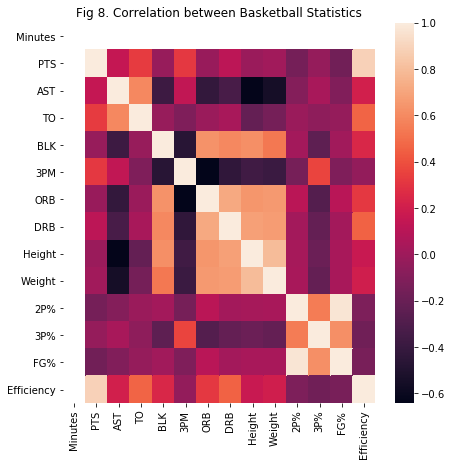

In [30]:
plt.figure(figsize=(7, 7))
plt.title("Fig 8. Correlation between Basketball Statistics")
sns.heatmap(analyze_position.corr())
plt.show()

We can see from the plot that features such as blocks/assists, 3 pointers made/blocks, and assists/rebounds all have low correlation. This shows that we should think about using those features in our model. Features with correlation coefficients of 1 or -1 imply that there will be redundancy in using both features. However, features with some, but not perfect, correlation can still contain predictive power when looking at players who may be categorized at the border of two positions.

We will further look into how player positions are distributed across features by creating a pairplot. This will tell us if there is any clear clustering or separation between the positions to see if they could be capturing any important differences. 

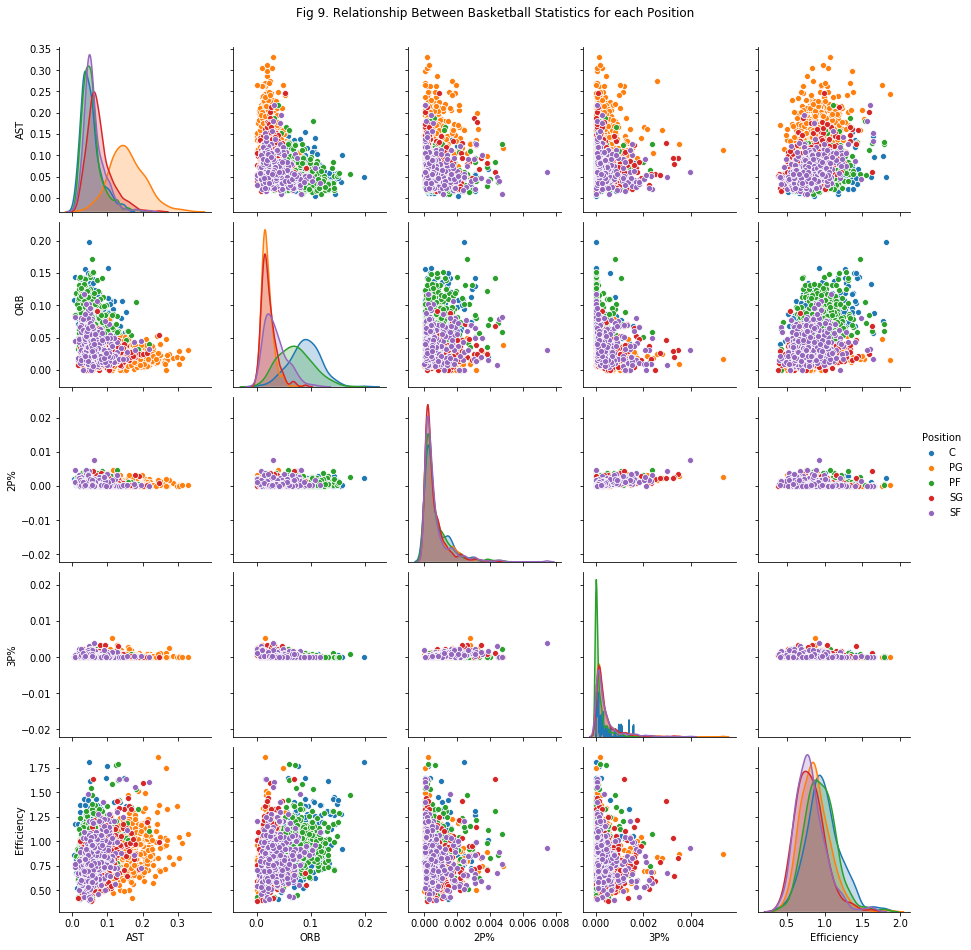

In [31]:
relationships = analyze_position[['AST', 'ORB', '2P%', '3P%', 'Efficiency', 'Position']]
graph = sns.pairplot(relationships, hue='Position', height=2.5)
graph.fig.suptitle("Fig 9. Relationship Between Basketball Statistics for each Position", y=1.04)
plt.show();

When looking at the pairplot, we can see that there is clean separation in player positions for assists/offensive rebounds. Thus, these are features we definitely want to include in our models.

Since the 'Team' column is categorical, we will use one-hot encoding to be able to use it as a feature. 

In [32]:
analyze_position_cleaned = analyze_position.drop(columns=['Minutes'])

In [33]:
analyze_position_with_team = pd.concat([analyze_position_cleaned, pd.get_dummies(analyze_position_cleaned['Team'], prefix='Team')], axis=1)
analyze_position_cleaned.drop(columns='Team', inplace=True)
analyze_position_with_team.drop(columns='Team', inplace=True)

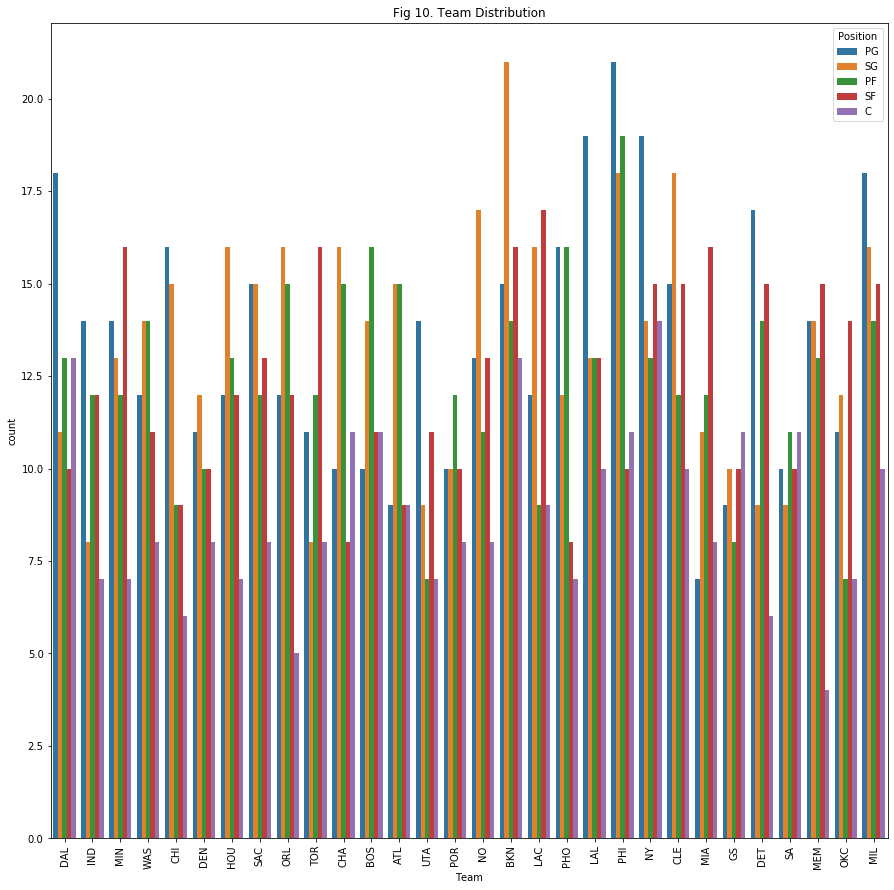

In [34]:
plt.figure(figsize=(15,15))
plt.title("Fig 10. Team Distribution")
graph = sns.countplot(x='Team', data=analyze_position, hue='Position', hue_order=analyze_position['Position'].value_counts().iloc[:5].index)
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
graph;

Looking at the Team distribution, the type of players are not evenly distributed among the teams, ensuring that the feature can provide value to our model. 

In order to depict rigor (we didn't know we had to save all our models), we have recreated our very first model that we ran logistic regression on before we further manipulated our data to include standardization (by minutes played), normalization, correct feature selection (including % of 2p, 3p, fg, teams and not including Steals, # of attempts, # of shots made, total rebounds). It had a training accuracy of 58% and test accuracy of 51% (not very good!)

In [35]:
def normalize(data):
    return pd.DataFrame(StandardScaler().fit_transform(data))

def create_logistic_regression_model(data, y_col, recreate=False):
    # recreate variable indicates that we are creating a model using no normalization
    print("Creating Logistic Regression Model...")
    position_train, position_test = train_test_split(data, test_size=0.25, random_state=100)

    x_train = position_train.loc[:, position_train.columns != y_col]
    y_train = position_train[y_col]
    x_test = position_test.loc[:, position_test.columns != y_col]
    y_test = position_test[y_col]
    if not recreate:
        x_test_n = normalize(x_test)
        x_train_n = normalize(x_train)

    model = LogisticRegression(random_state=42)

    if recreate:
        model.fit(x_train, y_train)
        lr_training_accuracy = model.score(x_train, y_train)
        lr_test_accuracy = model.score(x_test, y_test)
    else:
        model.fit(x_train_n, y_train)
        lr_training_accuracy = model.score(x_train_n, y_train)
        lr_test_accuracy = model.score(x_test_n, y_test)

    print("Training Accuracy: " + str(lr_training_accuracy))
    print("Test Accuracy: " + str(lr_test_accuracy))
    return model

In [36]:
recreate_start = player_box_scores_model
recreate_start = recreate_start.groupby(['playDispNm','playWeight','playHeight', 'playPos']).agg(np.sum)
recreate_start = recreate_start[recreate_start['playPTS'] >= 10]
recreate_start = recreate_start[recreate_start['playMin'] >= 96]

recreate_start = recreate_start.reset_index(level=[1,2,3])

recreate_start = recreate_start[['playPos','playMin','playPTS','playAST','playTO','playSTL','playBLK','playFGA', 'playFGM', 'play2PA', 'play2PM', 'play3PA', 'play3PM', 'playFTA','playFTM', 'playORB', 'playDRB', 'playTRB','playHeight', 'playWeight']]
recreate_start.columns = ['Position','Minutes','PTS','AST','TO','STL','BLK','FGA','FGM','2PA','2PM','3PA','3PM','FTA', 'FTM', 'ORB','DRB','REB','Height','Weight']
recreate_start.drop(columns=['REB', 'Minutes'], inplace=True)

recreate_model = create_logistic_regression_model(recreate_start, 'Position', True)

Creating Logistic Regression Model...
Training Accuracy: 0.5751633986928104
Test Accuracy: 0.51171875


/Users/melaniecooray/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Thus, we made the following changes: standardized our data by minutes, selected features AND deselected features based on re-running our pairplot and heatmap. We also normalized our x values. All these steps resulted in a much more improved model.

In [37]:
lr_model = create_logistic_regression_model(analyze_position_cleaned, 'Position')

Creating Logistic Regression Model...
Training Accuracy: 0.7586460632818248
Test Accuracy: 0.724669603524229


We will also try using a Random Forest Model.

In [38]:
def create_random_forest_model(data, y_col):
    print("Creating Random Forest Model...")
    position_train, position_test = train_test_split(data, test_size=0.25, random_state=100)

    x_train = position_train.loc[:, position_train.columns != y_col]
    x_train_n = normalize(x_train)
    y_train = position_train[y_col]
    x_test = position_test.loc[:, position_test.columns != y_col]
    x_test_n = normalize(x_test)
    y_test = position_test[y_col]
    #best is n_estim = 100, max_depth = 12
    random_forest_model = ensemble.RandomForestClassifier(random_state=42, n_estimators=100, max_depth=12)
    random_forest_model.fit(x_train_n, y_train)

    rf_training_accuracy = random_forest_model.score(x_train_n, y_train)
    rf_test_accuracy = random_forest_model.score(x_test_n, y_test)
    print("Training Accuracy: " + str(rf_training_accuracy))
    print("Test Accuracy: " + str(rf_test_accuracy))
    return random_forest_model

In [39]:
rf_model = create_random_forest_model(analyze_position_cleaned, 'Position')

Creating Random Forest Model...
Training Accuracy: 0.9941133186166299
Test Accuracy: 0.7444933920704846


Adding Principal Component 2 (the component which seemed to represent player position/archetype) as a feature of our model.

In [40]:
analyze_position_cleaned['pc2'] = player_box_scores_2_pcs['pc2'].groupby('playDispNm').first()

In our next iteration of modeling, we will re-train our logistic regression and random forest models on data that includes principal component 2.

In [41]:
lr_model = create_logistic_regression_model(analyze_position_cleaned, 'Position')

Creating Logistic Regression Model...
Training Accuracy: 0.7593818984547461
Test Accuracy: 0.7180616740088106


/Users/melaniecooray/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Our logistic regression model performs slightly worse when adding the second principal component. However, all of the testing accuracies (for logistic regression and random forest) seem to be around 73%.

In [42]:
rf_model = create_random_forest_model(analyze_position_cleaned, 'Position')

Creating Random Forest Model...
Training Accuracy: 0.9948491537895512
Test Accuracy: 0.751101321585903


Our random forest model performs better with PC2. We believe this is because PC2 is fairly accurately predicting the player's position.

In this next iteration of modeling, we will include the team feature that we have one hot encoded. According to our graph above, we can see that the team can help identify certain player's positions.

In [43]:
lr_with_team_model = create_logistic_regression_model(analyze_position_with_team, 'Position')

Creating Logistic Regression Model...
Training Accuracy: 0.7637969094922737
Test Accuracy: 0.7092511013215859


/Users/melaniecooray/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [44]:
rf_with_team_model = create_random_forest_model(analyze_position_with_team, 'Position')

Creating Random Forest Model...
Training Accuracy: 0.9867549668874173
Test Accuracy: 0.737885462555066


This logistic regression model and random forest model perform the worst so far, indicating that the team feature didn't help to determine the player's position.

In our last iteration of modeling, we will create a logistic regression model and a random forest model that include all the original features, Principal Component 2, and all the teams (one hot encoded).

In [45]:
analyze_position_with_team['pc2'] = player_box_scores_2_pcs['pc2'].groupby('playDispNm').first()

In [46]:
lr_with_team_pc_model = create_logistic_regression_model(analyze_position_with_team, 'Position')

Creating Logistic Regression Model...
Training Accuracy: 0.7689477557027226
Test Accuracy: 0.7224669603524229


/Users/melaniecooray/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [47]:
rf_with_team_pc_model = create_random_forest_model(analyze_position_with_team, 'Position')

Creating Random Forest Model...
Training Accuracy: 0.9904341427520236
Test Accuracy: 0.7224669603524229


This logistic regression model performs much better than our original baseline (51% test accuracy) and our best model is the random forest that include PC2 as an extra feature (75.1% test accuracy)!

# **Question 2: How many points will a team score based on their game statistics?**

One of our original ideas for a question is to predict the number of points a team will score, given the rest of the statistics in a game. For example, if we know how many blocks, assists, steals etc. and all the stats of the opponent including how many points the opponent scored. How many points would we score and would we win the game. 

 ~ ** * !!!! BONUS ANALYSIS !!!! * ** ~

Below we conduct some basic data cleaning, and utilize the team_box_scores table.

In [48]:
#Caculate Year
team_box_scores['year'] = team_box_scores['gmDate'].str[:4] 

#Calculate Team Points -- What we're trying to predict
team_box_scores['teamTotal'] = team_box_scores['teamPTS1'] + team_box_scores['teamPTS2'] +  team_box_scores['teamPTS3'] + team_box_scores['teamPTS4']
+ team_box_scores['teamPTS5'] + team_box_scores['teamPTS6'] + team_box_scores['teamPTS7'] + team_box_scores['teamPTS8']
#Calculate Opponents Points -- Their total points
team_box_scores['opptTotal'] = team_box_scores['opptPTS1'] + team_box_scores['opptPTS2'] +  team_box_scores['opptPTS3'] + team_box_scores['opptPTS4']
+ team_box_scores['opptPTS5'] + team_box_scores['opptPTS6'] + team_box_scores['opptPTS7'] + team_box_scores['opptPTS8']

team_box_scores_cleaned = team_box_scores[['year', 'teamTotal', 'teamAST', 'teamTO', 'teamSTL', 'teamBLK', 'teamFGA', 'teamFGM', 'teamFG%', 'team2P%', 'team3P%', 'teamFT%', 'teamORB', 'teamDRB', 'teamTRB', 'teamEFG%', 'teamFIC', 'teamFIC40', 'teamOrtg', 'teamDrtg', 'opptTotal', 'opptAST', 'opptTO', 'opptSTL', 'opptBLK', 'opptFGA', 'opptFGM', 'opptFG%', 'oppt2P%', 'oppt3P%', 'opptFT%', 'opptORB', 'opptDRB', 'opptTRB', 'opptEFG%', 'opptFIC', 'opptFIC40', 'opptOrtg', 'opptDrtg']]


In [49]:
def process_data_fm(data):
    Y = np.array(data.loc[:, 'teamTotal'])
    data.drop('teamTotal',axis=1,inplace=True)
    X = np.array(data)
    return X, Y, data

We have also defined a function above to split our data into appropriate X and Y arrays. Below, we split our data into train and test data. We also create a heatmap depictng the correlation between the features.

/Users/melaniecooray/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Text(0.5, 1, 'Correlation between features')

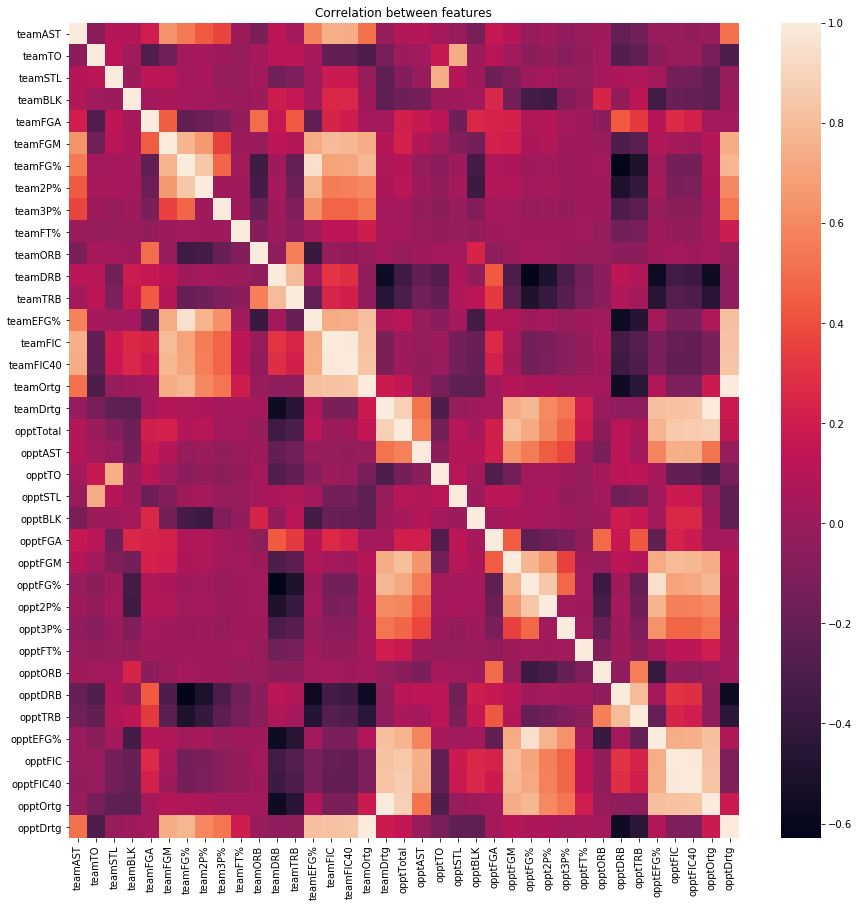

In [50]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(team_box_scores_cleaned, test_size=0.1, random_state=42)
X_train, Y_train, X_df = process_data_fm(train)
X_test, Y_test, X_test_df = process_data_fm(test)
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(X_df.corr(),ax=ax)
plt.title('Correlation between features')

From the plot above, we can see there are a few features that are highly correlated and we should remove from our model. The teamFIC/FIC40/EFG% are all highly correlated to each other, so we only need to include one to exclude redundant features. Also, the opptDrtg (opponent defensive rating) is correlated to the teamOrtg (team offensive rating).

To take care of these redundant features, we tried to use regularization

In [51]:
from sklearn.model_selection import KFold
from sklearn.base import clone
from sklearn.linear_model import LinearRegression

def rmse(predicted, actual):
    return np.sqrt(np.mean((actual - predicted)**2))

def rmse_score(model, X, y):
    return np.sqrt(np.mean((y - model.predict(X)) ** 2))

def cross_validate_rmse(model, X, y):
    model = clone(model)
    five_fold = KFold(n_splits=5)
    rmse_values = []
    for tr_ind, va_ind in five_fold.split(X):
        model.fit(X[tr_ind], y[tr_ind])
        rmse_values.append(rmse(y[va_ind], model.predict(X[va_ind])))
    return np.mean(rmse_values)


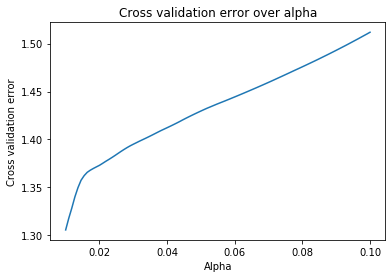

The best alpha value is 0.01
Cross validation error for the best alpha value is 1.3056551007680157


In [52]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import cross_val_score
X_train_normalized = normalize(X_train)
X_test_normalized = normalize(X_test)
model = Lasso(alpha = 1)
model.fit(X_train_normalized, Y_train)

alpha_arr = np.linspace(0.01, 0.1, 100)
cv_errors = []
model = Pipeline([("transformer", StandardScaler()),
    ("LinearModel", Lasso(max_iter = 1000000))
]) 

for alpha in alpha_arr:
    model.set_params(LinearModel__alpha=alpha)

    # compute the cross validation error
    cv_error = np.mean(cross_val_score(model, X_train_normalized, Y_train, scoring=rmse_score, cv=5))
    
    cv_errors.append(cv_error)
    
best_alpha_lasso = alpha_arr[np.argmin(cv_errors)]

plt.plot(alpha_arr, cv_errors)
plt.title('Cross validation error over alpha')
plt.xlabel('Alpha')
plt.ylabel('Cross validation error')
plt.show()

print(f"The best alpha value is {best_alpha_lasso}")
print(f"Cross validation error for the best alpha value is {cv_errors[np.argmin(cv_errors)]}")

However, as you can see from the chart above, we are told that the best alpha value is 0.01 which means that regularization is not needed. Thus, we created a normal Linear Regression model and it turns out that the model is 99% accurate. 

In [53]:
lin_model = LinearRegression()
X_train_normalized = normalize(X_train)
X_test_normalized = normalize(X_test)
lin_model.fit(X_train_normalized, Y_train)

y_pred_train = lin_model.predict(X_train_normalized)

training_accuracy = lin_model.score(X_train_normalized, Y_train)
tr_rmse = rmse(y_pred_train, Y_train)
cv_rmse = cross_validate_rmse(lin_model, X_train, Y_train)

print('Training acc:', training_accuracy*100)
print('Test acc:', lin_model.score(X_test_normalized, Y_test)*100)
print("Training:",tr_rmse)
print("CV:",cv_rmse)

Training acc: 99.09678622881184
Test acc: 99.08557346097349
Training: 1.1288487341055675
CV: 1.1337111387821839


Thus, we realized that this question is not a suitable one to answer. After going through the coefficients, we worked our way backwards and realized that our model is highly dependent on FIC40 and opponent score. If we remove FIC40, it becomes reliant on FIC. If we remove FIC it becomes reliant on EFG%. If we remove EFG%, it becomes reliant on FGM. At each of these steps the accuracy goes down (i.e. we're worsening our model). This highlights the strong correlation between FIC40 and one team's points scored! 

In [54]:
lin_model.coef_

array([ 1.41383755e-02, -3.86522265e-01,  1.60749871e+00, -1.73514010e-01,
       -1.88525232e-01,  4.91346471e-01,  1.02568019e+00, -6.74346462e-01,
        3.30257098e-02, -3.89942133e-02, -3.32552103e-01, -1.13216810e+00,
        5.39735731e-01, -2.33165917e-01, -1.53743790e+00, -2.49120051e+01,
        2.62230077e+01,  5.62709043e+00, -2.18994416e+00,  8.17543639e+00,
        3.92266125e-01,  1.04481914e+00,  1.89689748e-01,  2.23859224e-01,
        1.54894114e+00, -1.60397713e+00,  2.15574124e+00, -8.02282117e-02,
       -3.08846766e-02, -3.34026418e-01, -8.76155046e-01,  7.64712323e-01,
        1.08033971e-01, -1.93527186e+00,  1.85665966e+01, -1.99201230e+01,
       -2.18994416e+00,  5.62709043e+00])

# **References**

https://arxiv.org/pdf/1511.04351.pdf

https://en.wikipedia.org/wiki/Player_tracking_(National_Basketball_Association)

https://projects.fivethirtyeight.com/carmelo/

https://nycdatascience.com/blog/student-works/predicting-nba-player-positions/

http://cs229.stanford.edu/proj2014/Luke%20Lefebure,%20Understanding%20Player%20Positions%20in%20the%20NBA.pdf
